# Data Literacy
#### University of Tübingen, Winter Term 2021/22
## Analysis and Visualization of 2018 Central Park Squirrel Census - Squirrel Data 
&copy; 2022 Guray Ozgur & Moritz Vannahme

In 2018 there has been a census of the population of squirrels in the New York Central Park. In this paper, we analyze and visualize this publicly available data to investigate patterns in squirrel color and behaviour.

For multiple years now, a census has been made of the New York Central Park squirrel population. The data is collected with the help of volunteers, who name themselves [Squirrel Sighters](https://www.centralparksquirrelcensus.com/) and made available to the public on their [webpage](https://data.cityofnewyork.us/Environment/2018-Central-Park-Squirrel-Census-Squirrel-Data/vfnx-vebw). In this paper we will work with the data from the 2018 Central Park Squirrel Census. It was collected by 323 volunteers and comprises a total of 3023 squirrel sightings. These do not necessarily represent unique squirrels and the official estimate is instead 2373, for a more precise estimate however, tagging would likely be required.
For our project, we have chosen to look into a variety of distributions potentially present in the data and visualized a selection of them.

#### Importing Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')
!pip install tueplots
from tueplots import bundles
plt.rcParams.update(bundles.neurips2021(usetex=False))

In [2]:
from src.utils import *
from src.make_plots import *
from src.pred_utils import *
from src.condProb import *

#### Data deployment

In [3]:
url = "https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2019/2019-10-29/nyc_squirrels.csv"
nyc_squirrels = pd.read_csv(url)
nyc_squirrels.rename(columns={'shift': 'slot'}, inplace=True)
nyc_squirrels.head()

,long,lat,unique_squirrel_id,hectare,slot,date,hectare_squirrel_number,age,primary_fur_color,highlight_fur_color,combination_of_primary_and_highlight_color,color_notes,location,above_ground_sighter_measurement,specific_location,running,chasing,climbing,eating,foraging,other_activities,kuks,quaas,moans,tail_flags,tail_twitches,approaches,indifferent,runs_from,other_interactions,lat_long,zip_codes,community_districts,borough_boundaries,city_council_districts,police_precincts
0,-73.956134,40.794082,37F-PM-1014-03,37F,PM,10142018,3,NaN,NaN,NaN,+,NaN,NaN,NaN,NaN,False,False,False,False,False,NaN,False,False,False,False,False,False,False,False,NaN,POINT (-73.9561344937861 40.7940823884086),NaN,19,4,19,13
1,-73.957044,40.794851,37E-PM-1006-03,37E,PM,10062018,3,Adult,Gray,Cinnamon,Gray+Cinnamon,NaN,Ground Plane,FALSE,NaN,True,False,False,False,False,NaN,False,False,False,False,False,False,False,True,me,POINT (-73.9570437717691 40.794850940803904),NaN,19,4,19,13
2,-73.976831,40.766718,2E-AM-1010-03,02E,AM,10102018,3,Adult,Cinnamon,NaN,Cinnamon+,NaN,Above Ground,4,NaN,False,False,True,False,False,NaN,False,False,False,False,False,False,True,False,NaN,POINT (-73.9768311751004 40.76671780725581),NaN,19,4,19,13
3,-73.975725,40.769703,5D-PM-1018-05,05D,PM,10182018,5,Juvenile,Gray,NaN,Gray+,NaN,Above Ground,3,NaN,False,False,True,False,False,NaN,False,False,False,False,False,False,False,True,NaN,POINT (-73.9757249834141 40.7697032606755),NaN,19,4,19,13
4,-73.959313,40.797533,39B-AM-1018-01,39B,AM,10182018,1,NaN,NaN,NaN,+,NaN,Above Ground,NaN,NaN,False,False,False,False,False,unknown,True,False,False,False,False,False,False,False,NaN,POINT (-73.9593126695714 40.797533370163),NaN,19,4,19,13


#### Data cleaning
Dealing with unwanted entries, dropping the unwanted columns

In [4]:
nyc_squirrels = dataset_fix(nyc_squirrels)

#### Counting plots

Counting individual features to see what is in the data

Number of observations is 3023.


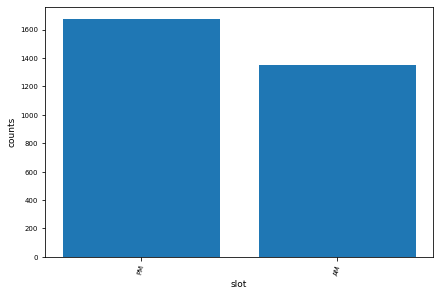

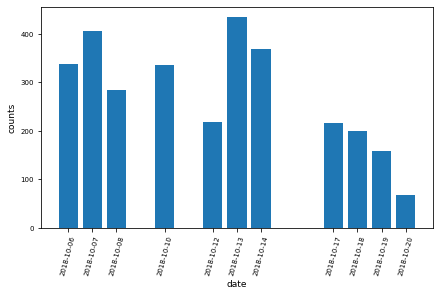

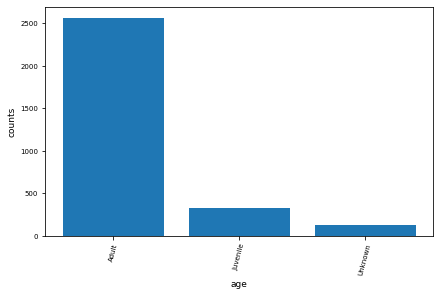

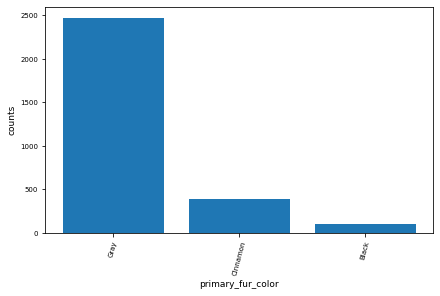

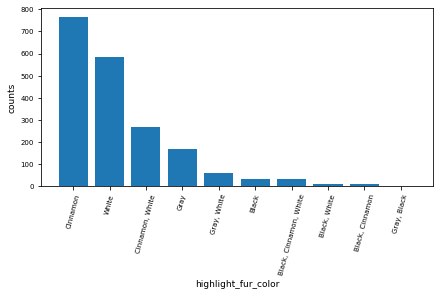

...

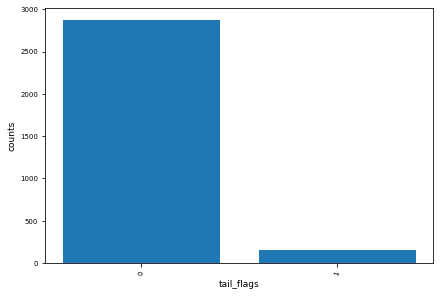

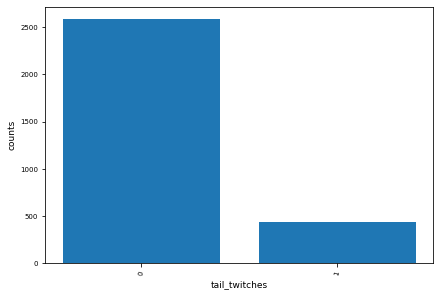

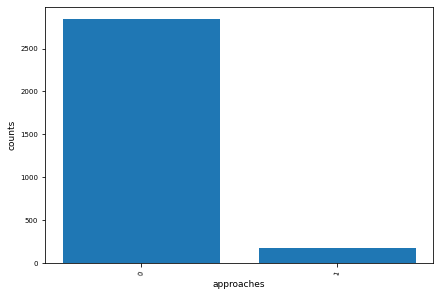

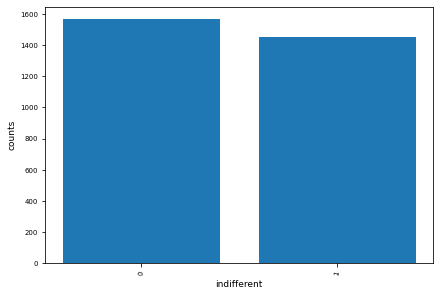

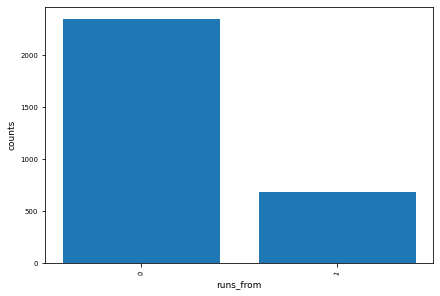

In [5]:
plot_counts(nyc_squirrels)
interest_list = ['slot', 'date', 'age', 'primary_fur_color',
       'highlight_fur_color', 'running', 'chasing', 'climbing', 'eating',
       'foraging', 'kuks', 'quaas', 'moans', 'tail_flags',
       'tail_twitches', 'approaches', 'indifferent', 'runs_from']
for c in interest_list:      
  plot_counts(nyc_squirrels, plotted_feature=c, save_fig=False)


#### Squirrel Distributions (creating maps)

The first approach we chose was to visualize the squirrels on a map of Central Park. Our initial step was to simply add a dot for each squirrel at its latitude and longitude coordinates. A later stage with dots coloured according to squirrel color can be seen. It makes obvious the prevalence of the Eastern grey squirrel (Sciurus carolinensis). Other maps showed the Time of Day the squirrel was sighted, the date or whether it was a juvenile or an adult. Notable information that can be gleaned from this is that squirrels particular seem to favour the area around Vista Rock. This is possibly due to it being a spot where people frequently stop for some time, meaning more food is available, either from visitors or from the trash. Another important observation can be even though the most populated area is the Vista Rock, it is not as much as populated by black squirrels.

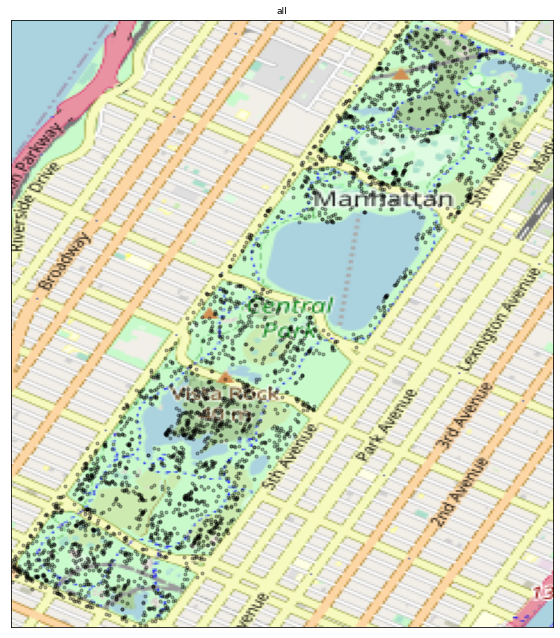

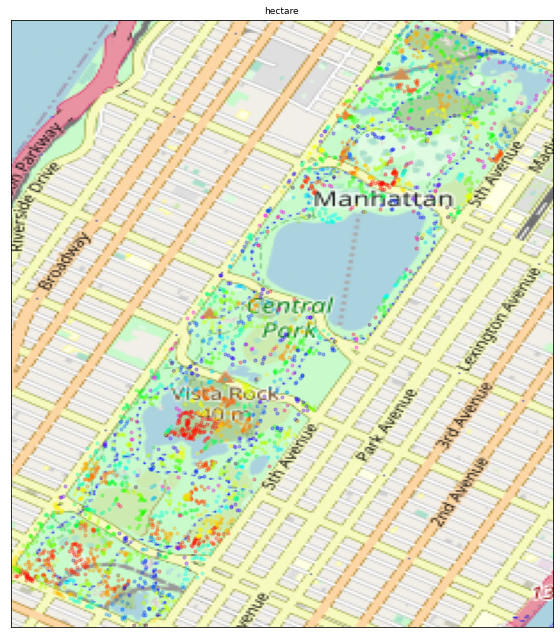

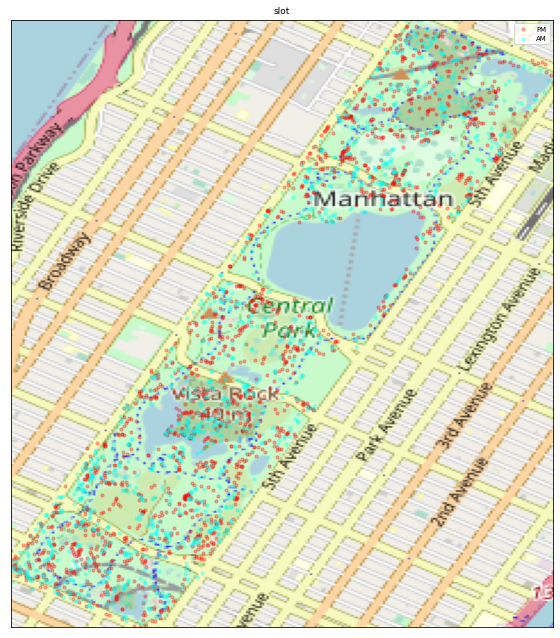

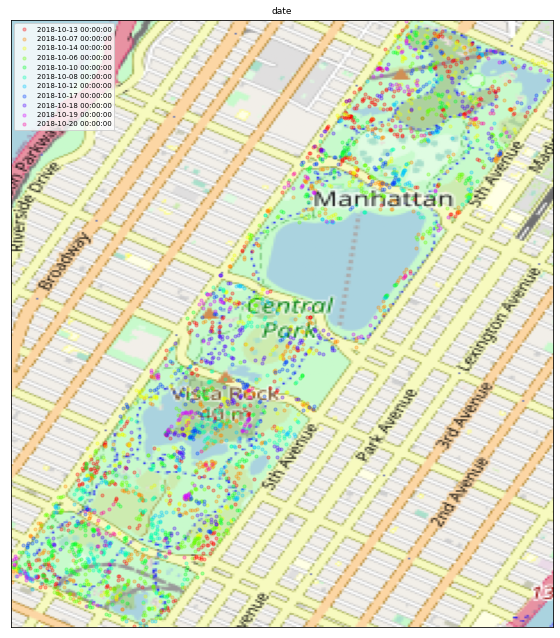

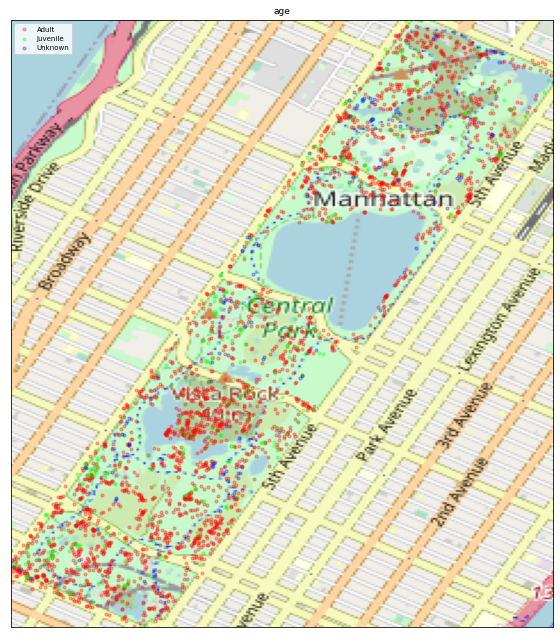

...

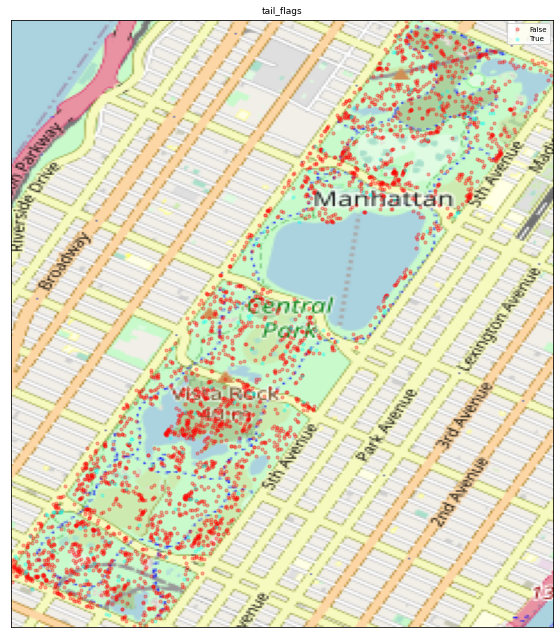

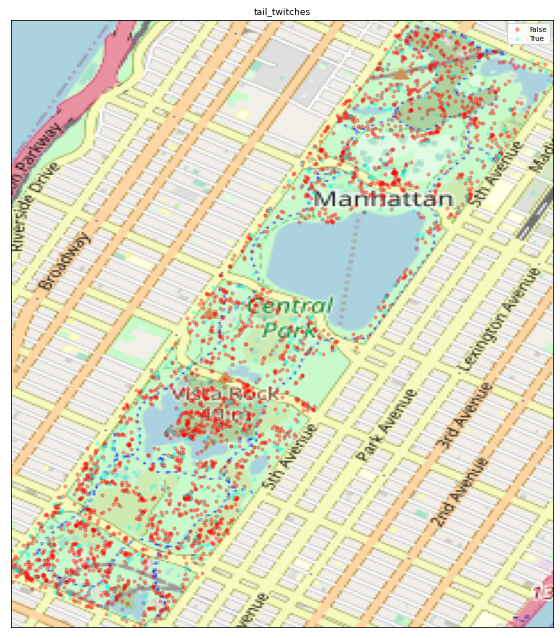

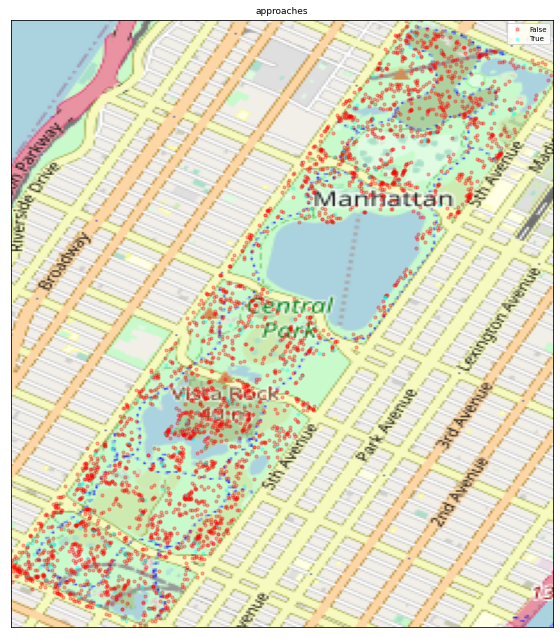

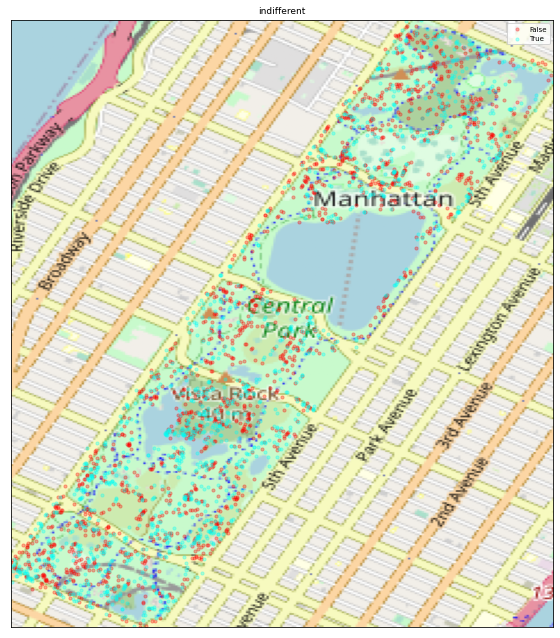

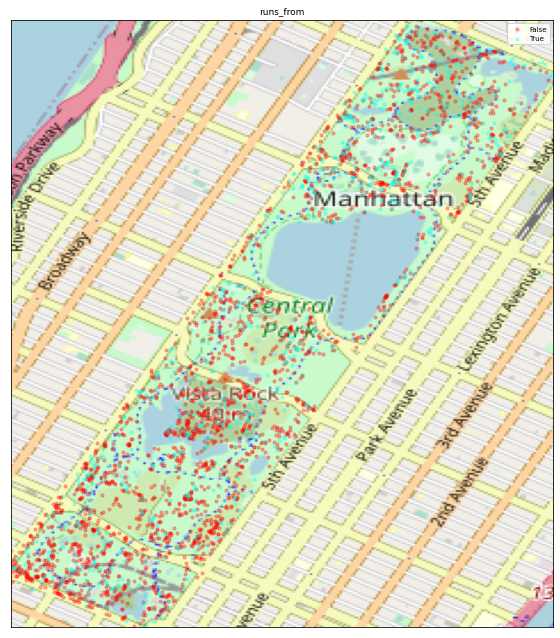

In [6]:
plot_maps(nyc_squirrels, save_fig=False)
interest_list = ['hectare', 'slot', 'date', 'age', 'primary_fur_color',
       'highlight_fur_color', 'running', 'chasing', 'climbing', 'eating',
       'foraging', 'kuks', 'quaas', 'moans', 'tail_flags',
       'tail_twitches', 'approaches', 'indifferent', 'runs_from']
for c in interest_list:      
  plot_maps(nyc_squirrels, plotted_feature=c, save_fig=False)

We also created a heat-map from the same data, by not using the coordinate information but hectare information, which can be seen in Fig. \ref{heatmap}. Despite being stripped of the identifying information of the geography of Central Park, it lets us guess at not only the the shape of the park but also the altitude even though the altitude information is not given at all in the data. The presence of the squirrels forms a kind of topographical map of the park. Especially, from the top-right of Fig. \ref{colormap}, it can be seen that squirrels with black primary color creates contours of the map.

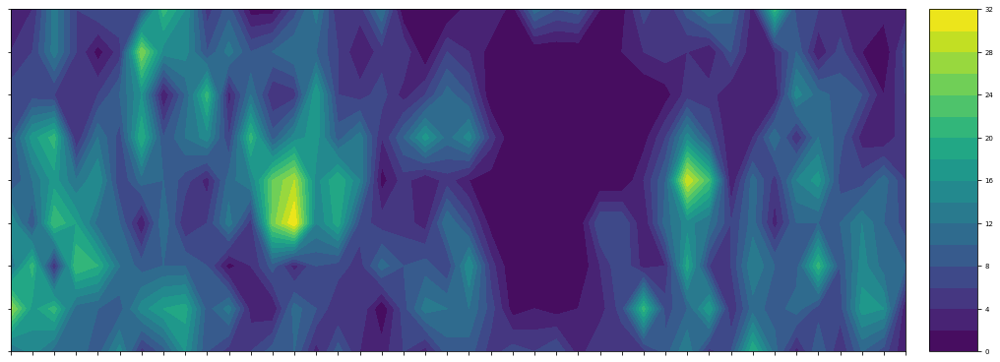

In [7]:
heatmap(nyc_squirrels, save_fig=False)

#### Fur Colors

Next, we took a closer look at the different colors of the squirrels. Each squirrel has one of three primary colors (Gray, Cinnamon, Black) or None if the recorder failed to identify the color. Each squirrel can then have any combination of those 3 colors or White as a highlight color (including having no highlight color at all). The split of highlight colors over the three primary colors is shown. None was omitted as the only highlight color recorded was None. Even after taking into consideration that primary and highlight color can not match, it is evident that the highlight colors follow different distribution depending on the primary color. Cinnamon squirrels show the highest variety in highlight color, with white, gray and cinnamon all being prevalent. Cinnamon is especially the only primary color with a significant level of tricolored squirrels. Black squirrels are primarily mono-colored with some few individuals having cinnamon or gray highlights. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


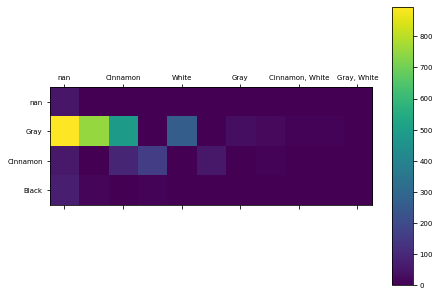

<Figure size 432x288 with 0 Axes>

In [8]:
color_combo = nyc_squirrels[['primary_fur_color', 'highlight_fur_color']]
color_combo['num_primary'] = [numColor(item) for item in color_combo['primary_fur_color']]
color_combo['num_highlight'] = [numColor(item) for item in color_combo['highlight_fur_color']]

primaryHighlightCombination = pd.DataFrame(\
                                           np.zeros([4,11]),\
                                           index=color_combo.primary_fur_color.unique(),\
                                           columns=color_combo.highlight_fur_color.unique())

for i in range(color_combo.shape[0]):
  item = color_combo.iloc[i]
  prim = item['primary_fur_color']
  high = item['highlight_fur_color']
  primaryHighlightCombination.at[prim, high] += 1


fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(primaryHighlightCombination)
fig.colorbar(cax)

ax.set_xticklabels(['']+color_combo.highlight_fur_color.unique().tolist())
ax.set_yticklabels(['']+color_combo.primary_fur_color.unique().tolist())

plt.show()
plt.savefig("fig/fur_relations.pdf",bbox_inches="tight") 

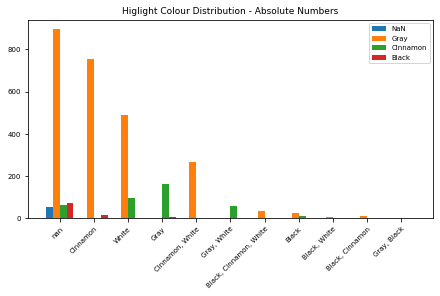

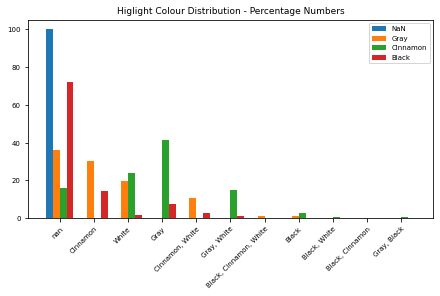

In [9]:
#Total Distribution of Highlight Colours
fig, ax = plt.subplots()
x = np.arange(len(primaryHighlightCombination.columns))
ax.bar(x-0.3, primaryHighlightCombination.loc[np.nan], width=0.2, label="NaN")
ax.bar(x-0.1, primaryHighlightCombination.loc['Gray'], width=0.2, label="Gray")
ax.bar(x+0.1, primaryHighlightCombination.loc['Cinnamon'], width=0.2, label="Cinnamon")
ax.bar(x+0.3, primaryHighlightCombination.loc['Black'], width=0.2, label="Black")

ax.set_title("Higlight Colour Distribution - Absolute Numbers")
ax.legend()
ax.set_xticks(np.arange(len(primaryHighlightCombination.columns)))
ax.set_xticklabels(primaryHighlightCombination.columns)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor");
plt.savefig("fig/highlight_dist_abs.pdf",bbox_inches="tight") 

fig, ax = plt.subplots()
nan = primaryHighlightCombination.loc[np.nan].sum()/100
gray = primaryHighlightCombination.loc['Gray'].sum()/100
cinnamon = primaryHighlightCombination.loc['Cinnamon'].sum()/100
black = primaryHighlightCombination.loc['Black'].sum()/100
ax.bar(x-0.3, primaryHighlightCombination.loc[np.nan]/nan, width=0.2, label="NaN")
ax.bar(x-0.1, primaryHighlightCombination.loc['Gray']/gray, width=0.2, label="Gray")
ax.bar(x+0.1, primaryHighlightCombination.loc['Cinnamon']/cinnamon, width=0.2, label="Cinnamon")
ax.bar(x+0.3, primaryHighlightCombination.loc['Black']/black, width=0.2, label="Black")

ax.set_title("Higlight Colour Distribution - Percentage Numbers")
ax.legend()
ax.set_xticks(np.arange(len(primaryHighlightCombination.columns)))
ax.set_xticklabels(primaryHighlightCombination.columns)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",rotation_mode="anchor");
plt.savefig("fig/highlight_dist_per.pdf",bbox_inches="tight") 

#### Behavioural Correlation
"Behaviour and Time", and "Behaviour and Color" are investigated.

In [10]:
def behaviourUpdate(frame,object,keyword):
  #Reads out all behaviours for a given squirrel and adds them to a dataframe under the keyword
  for column in frame.columns:
    if(object[column]):
      frame[column][keyword] += 1

def update(frame, object, keyword):
  #Checks for keyword presence then reads behaviour
  if(object[keyword]):
    behaviourUpdate(frame, object, keyword)

In [11]:
# Time
color_time = nyc_squirrels[['primary_fur_color', 'slot']]

colorTimeCombo= pd.DataFrame(\
                             np.zeros([4,2]),\
                             index=color_time.primary_fur_color.unique(),\
                             columns=color_time.slot.unique())

for i in range(color_time.shape[0]):
  item = color_time.iloc[i]
  prim = item['primary_fur_color']
  time = item['slot']
  colorTimeCombo.at[prim, time] += 1
colorTimeCombo.loc[np.nan] = colorTimeCombo.loc[np.nan]/nan
colorTimeCombo.loc["Gray"] = colorTimeCombo.loc["Gray"]/gray
colorTimeCombo.loc["Cinnamon"] = colorTimeCombo.loc["Cinnamon"]/cinnamon
colorTimeCombo.loc["Black"] = colorTimeCombo.loc["Black"]/black

colorTimeCombo

,PM,AM
NaN,47.272727,52.727273
Gray,56.045289,43.954711
Cinnamon,54.081633,45.918367
Black,50.485437,49.514563


In [12]:
# P(Column | Row) but for Behaviour and Color
color_behaviour_relation = pd.DataFrame(\
                                        np.zeros([4,13]),\
                                        index=[np.nan, "Gray", "Cinnamon", "Black"],\
                                        columns=["running", "chasing", "climbing", "eating", "foraging", "kuks", "quaas", "moans", "tail_flags", "tail_twitches", "approaches", "indifferent", "runs_from"])

for i in range(len(nyc_squirrels.index)):
  row = nyc_squirrels.iloc[i]
  keyword = row["primary_fur_color"]
  behaviourUpdate(color_behaviour_relation, row, keyword)

#Normalize to percentages
for col in color_behaviour_relation.columns:
  color_behaviour_relation[col][np.nan] =\
   round(color_behaviour_relation[col][np.nan]/nan,1)
  color_behaviour_relation[col]["Gray"] =\
   round(color_behaviour_relation[col]["Gray"]/gray,1)
  color_behaviour_relation[col]["Cinnamon"] =\
   round(color_behaviour_relation[col]["Cinnamon"]/cinnamon,1)
  color_behaviour_relation[col]["Black"] =\
   round(color_behaviour_relation[col]["Black"]/black,1)

color_behaviour_relation

,running,chasing,climbing,eating,foraging,kuks,quaas,moans,tail_flags,tail_twitches,approaches,indifferent,runs_from
NaN,7.3,7.3,32.7,10.9,10.9,18.2,9.1,1.8,1.8,5.5,3.6,18.2,14.5
Gray,24.1,9.6,21.6,25.0,47.8,3.2,1.4,0.1,4.9,13.7,5.1,49.3,22.3
Cinnamon,26.3,7.7,20.9,28.3,51.8,2.6,1.3,0.0,6.6,19.1,11.2,46.2,22.2
Black,25.2,6.8,24.3,23.3,41.7,2.9,4.9,0.0,5.8,17.5,5.8,42.7,31.1


#### Behavioural Correlation - Internal

We investigated the correlation between different behaviours of squirrels. It should be noted that due to being nominal data, the information given is in the form of conditional probability, not covariance. While we can see what appears like strong relations especially in the case of "foraging" and "indifferent", these should be treated with caution as they each make up about 50\% of all recorded squirrels. Consequently the strong relation can actually be seen in those examples where the odds are disproportionately low. This is the case for intuitively mutually exclusive behaviours like indifferent-approaches-runs\_from or foraging-climbing-chasing.  Kukking and quaaing also predict against indifferent. As these are both danger signalling noises this is consistent with expectations. Moaning should be disregarded due to only showing up 3 times across all sightings.

#### This is P(Column | Row) not Covariance!

That's why we get asymmetry.

In [13]:
behaviours = nyc_squirrels[["running", "chasing", "climbing", "eating", "foraging", "kuks", "quaas", "moans", "tail_flags", "tail_twitches", "approaches", "indifferent", "runs_from"]]

behaviour_relation = pd.DataFrame(np.zeros([behaviours.columns.size, behaviours.columns.size]), index=behaviours.columns, columns=behaviours.columns)

for index, row in behaviours.iterrows():
  for column in behaviour_relation.columns:
    update(behaviour_relation, row, column)

In [14]:
for row in behaviour_relation.index:
  ref_val = behaviour_relation[row][row]
  print(str(row) + " Total: " + str(ref_val))
  for col in behaviour_relation.columns:
    behaviour_relation[col][row] = round((behaviour_relation[col][row]/ref_val)*100, 1)

running Total: 730.0
chasing Total: 279.0
climbing Total: 658.0
eating Total: 760.0
foraging Total: 1435.0
kuks Total: 102.0
quaas Total: 50.0
moans Total: 3.0
tail_flags Total: 155.0
tail_twitches Total: 434.0
approaches Total: 178.0
indifferent Total: 1454.0
runs_from Total: 678.0


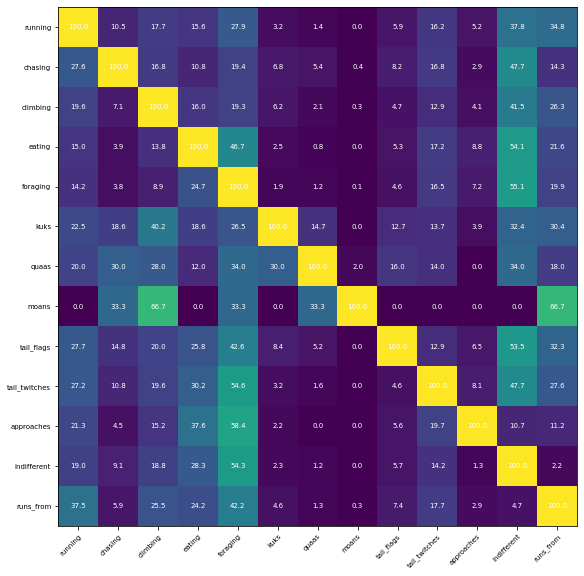

In [15]:
plot_behaviourmap(nyc_squirrels, behaviours, behaviour_relation, save_fig=False)

#### Numerating the data

Here, we normalized the data column-wise with min-max normalization after numerating.

In [16]:
nyc_squirrels = dataset_numerate(nyc_squirrels)
normalized_nyc_squirrels = nyc_squirrels

# Column-wise min-max normalization
for x in nyc_squirrels.columns.unique():
  normalized_nyc_squirrels[x]=(nyc_squirrels[x]-nyc_squirrels[x].min())/(nyc_squirrels[x].max()-nyc_squirrels[x].min())

In [17]:
nyc_squirrels = normalized_nyc_squirrels

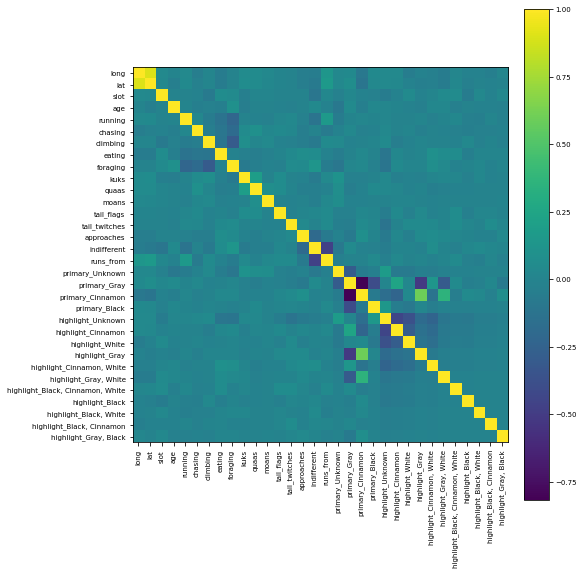

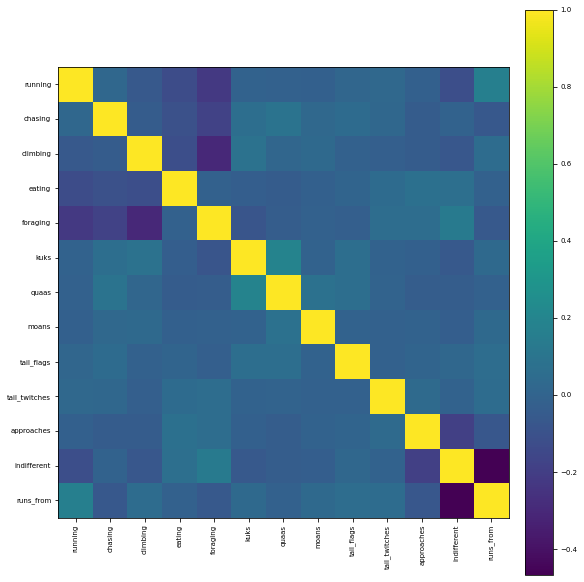

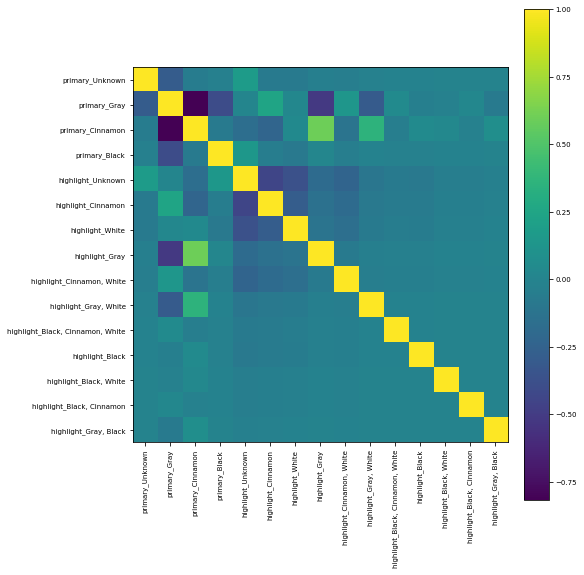

In [18]:
behaviours = ["running", "chasing", "climbing", "eating", "foraging", "kuks", 
          "quaas", "moans", "tail_flags", "tail_twitches", "approaches", 
          "indifferent", "runs_from"]
          
colours = ['primary_Unknown', 'primary_Gray', 'primary_Cinnamon', 'primary_Black',
       'highlight_Unknown', 'highlight_Cinnamon', 'highlight_White',
       'highlight_Gray', 'highlight_Cinnamon, White', 'highlight_Gray, White',
       'highlight_Black, Cinnamon, White', 'highlight_Black',
       'highlight_Black, White', 'highlight_Black, Cinnamon',
       'highlight_Gray, Black']

plot_correlation(nyc_squirrels, nyc_squirrels.columns, "all", save_fig=False) 
plot_correlation(nyc_squirrels, behaviours, "behaviours", save_fig=False)  
plot_correlation(nyc_squirrels, colours, "colours", save_fig=False)  

#### Logistic Regression

In addition to the above analysis, we created a logistic regression model of different squirrel qualities. We used a Training/Test split of 75/25. We see that a logistic regression is able to achieve some success in predicting the primary color from the highlight colors and significant success in determining whether a squirrel was eating and whether it was indifferent to humans from its other behaviours.

In [19]:
def make_predictions(nyc_squirrels, prediction_of = "primary_Gray", train_test_ratio = 0.75, mod="LogisticRegression"):
  
  predictors, label, columns = x_y_pairs(nyc_squirrels, prediction_of)
  train_X, train_Y, test_X, test_Y = split_data(predictors, label, train_test_ratio)
  model = fit(train_X, train_Y, mod)
  acc = test_accuracy(model, test_X, test_Y, mod)
  coef_dic = dict(zip(columns, model.coef_.reshape(-1,1)))

  return model, coef_dic, acc

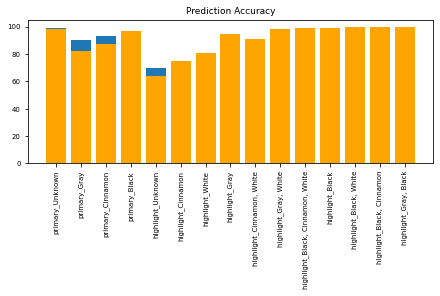

In [20]:
colours = ['primary_Unknown', 'primary_Gray', 'primary_Cinnamon', 'primary_Black',
       'highlight_Unknown', 'highlight_Cinnamon', 'highlight_White',
       'highlight_Gray', 'highlight_Cinnamon, White', 'highlight_Gray, White',
       'highlight_Black, Cinnamon, White', 'highlight_Black',
       'highlight_Black, White', 'highlight_Black, Cinnamon',
       'highlight_Gray, Black']

colour_acc = []
count_common = []
for colour in colours:
  _, _, acc = make_predictions(nyc_squirrels, colour)
  colour_acc.append(acc)
  count_common.append(pd.DataFrame(nyc_squirrels[colour].value_counts()).reset_index()[colour][0])
count_common = 100*np.array(count_common)/(nyc_squirrels.shape[0])
colours_acc = dict(zip(colours, colour_acc))
colours_count = dict(zip(colours, count_common.tolist()))
dict_plot(colours_acc, colours_count, name = "colours_acc", save_fig=False)

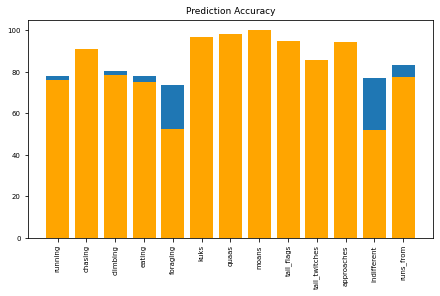

In [21]:
behaviours = ['running', 'chasing', 'climbing',
       'eating', 'foraging', 'kuks', 'quaas', 'moans', 'tail_flags',
       'tail_twitches', 'approaches', 'indifferent', 'runs_from']

behaviour_acc = []
count_common = []
for behaviour in behaviours:
  _, _, acc = make_predictions(nyc_squirrels, behaviour)
  behaviour_acc.append(acc)
  count_common.append(pd.DataFrame(nyc_squirrels[behaviour].value_counts()).reset_index()[behaviour][0])
count_common = 100*np.array(count_common)/(nyc_squirrels.shape[0])
behaviours_acc = dict(zip(behaviours, behaviour_acc))
behaviours_count = dict(zip(behaviours, count_common.tolist()))
dict_plot(behaviours_acc, behaviours_count, "behaviours_acc", save_fig=False)

#### Mean Difference and Normalized Mean Difference Calculation

We also used the Themis-ML, developed by \cite{bantilan2017} to calculate mean difference scores for color and age with regard to foraging. We found that black squirrels were more likely to be foraging while juveniles were less likely. Perhaps black squirrels are more curious and less wary to be humans and consequently approach them, while juvenile squirrels are either cared for by their parents or simply more wary of the unknown.

In [22]:
!pip install themis_ml

In [23]:
from themis_ml.metrics import mean_difference, normalized_mean_difference

sensitive_attributes = ["primary_Gray", "primary_Cinnamon", "primary_Black", "age"]
for sensitive in sensitive_attributes:
  if sensitive == "age":
    attribute = nyc_squirrels[sensitive].replace(0.5, 0)
  else:
    attribute = nyc_squirrels[sensitive]
  foraging = nyc_squirrels["foraging"]

  print("\nMean difference scores:")
  print("protected class = "+str(sensitive)+": ", str(mean_difference(foraging, attribute)[0]))
  print("Normalized mean difference scores:")
  print("protected class = "+str(sensitive)+": ", str(normalized_mean_difference(foraging, attribute)[0]))


Mean difference scores:
protected class = primary_Gray:  -0.020184538470021662
Normalized mean difference scores:
protected class = primary_Gray:  -0.031433478360430464

Mean difference scores:
protected class = primary_Cinnamon:  -0.04959412499321286
Normalized mean difference scores:
protected class = primary_Cinnamon:  -0.09092832254853174

Mean difference scores:
protected class = primary_Black:  0.059236600611783485
Normalized mean difference scores:
protected class = primary_Black:  0.12053719427624235

Mean difference scores:
protected class = age:  -0.13967255485947072
Normalized mean difference scores:
protected class = age:  -0.22586846402967306
